#Data Augmentation for Vehicle Detection with Generative AI

## Introduction

This notebook demonstrates various image data augmentation techniques to enhance and diversify training data for a vehicle detection task. The dataset is sourced from Kaggle's [Top-View Vehicle Detection Dataset](https://www.kaggle.com/datasets/farzadnekouei/top-view-vehicle-detection-image-dataset), which includes 400 training images and labels, and 33 validation images and labels. We aim to improve vehicle detection performance using a pre-trained YOLOv8 model through the following augmentation techniques:

- **Geometric Augmentation** using Keras’ `ImageDataGenerator`: This involves random rotations, flips, zooms, and other transformations to create 5 samples for each input image.
- **BigGAN Model**: For each input sample, we use the pre-trained BigGAN model to generate 1 synthetic image of the vehicle class.
- **Stable Diffusion Model**: We generate 1 new sample per input based on descriptive prompts using a pre-trained Stable Diffusion model.

After augmentation, the dataset is used for inference with a pre-trained YOLOv8 model to evaluate the performance of vehicle detection.

All augmented images are saved to a Google Cloud Storage (GCS) bucket for future use in training or evaluation.


## Setup and Installations

Before we begin, we need to authenticate with Google Cloud and install necessary libraries. The following steps initialize the cloud storage, install libraries like TensorFlow, Keras, Transformers, and Stable Diffusion models, and set up YOLOv8 for object detection.


In [ ]:
# Authentication for Google Cloud
from google.colab import auth
auth.authenticate_user()

# Set Google Cloud project
project_id = "project_id". #Give the project id
!gcloud config set project {project_id}


Updated property [core/project].


In [ ]:
# Install necessary packages
!pip install google-cloud-automl keras tensorflow transformers huggingface_hub diffusers torch torchvision ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 334.0/334.0 kB 25.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 93.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.8/882.8 kB 55.9 MB/s eta 0:00:00


###  Data Loading and Preparation

We will load the training and validation datasets from Google Cloud Storage (GCS). The dataset contains images of vehicles taken from a top view, which are stored in separate directories for training and validation. The dataset is downloaded from the GCS bucket to the local environment for augmentation and model inference.




Step 1: Define the storage client variables

In [ ]:
from google.cloud import automl_v1beta1 as automl
from google.cloud import storage

# Define the AutoML Vision client
client = automl.AutoMlClient()

# Define the storage client for GCS
storage_client = storage.Client()
bucket_name = 'bucket name' #bucket name
dataset_name = 'Vehicle_Detection_Image_Dataset' #Dataset name

# Specify the location of your training and validation data
gcs_train_data = f"gs://{bucket_name}/{dataset_name}/train/"
gcs_valid_data = f"gs://{bucket_name}/{dataset_name}/valid/"


Step 2: Define the fucntion to load the data from GCS bucket

In [ ]:
import pandas as pd
import os
import numpy as np
from tensorflow.keras.preprocessing import image


# Function to load image data and labels into a dataframe
def load_data_as_dataframe(image_dir, label_col_name='label'):
    """
    Load images and labels from a directory structure and return a DataFrame.

    Args:
    - image_dir (str): Directory containing images organized in subdirectories for each class.
    - label_col_name (str): Column name for labels in the resulting dataframe.

    Returns:
    - df (pd.DataFrame): DataFrame with image paths and corresponding labels.
    """
    image_paths = []
    labels = []

    # Walk through image directory and collect file paths and labels
    for subdir, dirs, files in os.walk(image_dir):
        for file in files:
            if file.endswith(('.png', '.jpg', '.jpeg')):
                image_paths.append(os.path.join(subdir, file))
                # Assuming subdirectory name is the label
                labels.append(os.path.basename(subdir))

    # Create dataframe
    df = pd.DataFrame({
        'image_path': image_paths,
        label_col_name: labels
    })

    return df

# Function to load images into numpy arrays
def load_images(df, target_size=(150, 150)):
    """
    Convert image paths in a dataframe to a numpy array of images.

    Args:
    - df (pd.DataFrame): DataFrame containing image paths.
    - target_size (tuple): Desired image size (height, width).

    Returns:
    - images (np.array): Array of images.
    """
    images = []
    for img_path in df['image_path']:
        img = image.load_img(img_path, target_size=target_size)
        img_array = image.img_to_array(img)
        images.append(img_array)

    return np.array(images)

Step 3: Define function to do download image data from gcs bucket to a local folder for data augmentation.

In [ ]:
def download_data_from_gcs(bucket_name, gcs_folder, local_folder):
    """
    Downloads all files from a GCS folder to a local directory.

    Args:
    - bucket_name (str): The name of the GCS bucket.
    - gcs_folder (str): The folder path in GCS.
    - local_folder (str): The local directory to store the downloaded files.
    """
    storage_client = storage.Client()
    bucket = storage_client.bucket(bucket_name)

    # Create local folder if it doesn't exist
    if not os.path.exists(local_folder):
        os.makedirs(local_folder)

    blobs = bucket.list_blobs(prefix=gcs_folder)
    for blob in blobs:
        # Skip folders in GCS
        if not blob.name.endswith('/'):
            destination_path = os.path.join(local_folder, os.path.basename(blob.name))
            blob.download_to_filename(destination_path)
            print(f"Downloaded {blob.name} to {destination_path}")

Step 4: Apply the above mentioned fucntions

In [ ]:
# Define your GCS bucket and dataset folder
bucket_name = 'bucket name'
train_gcs_folder = 'Vehicle_Detection_Image_Dataset/train/'
valid_gcs_folder = 'Vehicle_Detection_Image_Dataset/valid/'

# Define local directories where the files will be stored
local_train_dir = './data/train'
local_valid_dir = './data/valid'

# Download the train and valid data from GCS to local directories
download_data_from_gcs(bucket_name, train_gcs_folder, local_train_dir)
download_data_from_gcs(bucket_name, valid_gcs_folder, local_valid_dir)

Downloaded Vehicle_Detection_Image_Dataset/train/images/10_mp4-10_jpg.rf.b87509668caff369c5501325477e6d9a.jpg to ./data/train/10_mp4-10_jpg.rf.b87509668caff369c5501325477e6d9a.jpg
Downloaded Vehicle_Detection_Image_Dataset/train/images/10_mp4-10_jpg.rf.ba480b311472ef957256801c3766128a.jpg to ./data/train/10_mp4-10_jpg.rf.ba480b311472ef957256801c3766128a.jpg
Downloaded Vehicle_Detection_Image_Dataset/train/images/10_mp4-11_jpg.rf.eb1b06090bd1c1814b87c18a2661990a.jpg to ./data/train/10_mp4-11_jpg.rf.eb1b06090bd1c1814b87c18a2661990a.jpg
Downloaded Vehicle_Detection_Image_Dataset/train/images/10_mp4-12_jpg.rf.daf65f51adfd1817d026f3d4c3cf3d4c.jpg to ./data/train/10_mp4-12_jpg.rf.daf65f51adfd1817d026f3d4c3cf3d4c.jpg
Downloaded Vehicle_Detection_Image_Dataset/train/images/10_mp4-14_jpg.rf.0f71b11f7cbb40b498e9f8032bf9a51c.jpg to ./data/train/10_mp4-14_jpg.rf.0f71b11f7cbb40b498e9f8032bf9a51c.jpg
Downloaded Vehicle_Detection_Image_Dataset/train/images/10_mp4-15_jpg.rf.7c56c088a40d06ad42da2024516

In [ ]:
# Directories for training and validation datasets
train_dir = local_train_dir
valid_dir = local_valid_dir

# Load train and validation datasets into dataframes
train_df = load_data_as_dataframe(train_dir)
valid_df = load_data_as_dataframe(valid_dir)

print("Info about Training Data:", train_df.info())
print("Shape of Training Data:", train_df.shape)
print("Columns in Training Data:", train_df.columns)
print("\n")

print("Info about Validation Data:", valid_df.info())
print("Shape of Validation Data:", valid_df.shape)
print("Columns in Validation Data:", valid_df.columns)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  400 non-null    object
 1   label       400 non-null    object
dtypes: object(2)
memory usage: 6.4+ KB
Info about Training Data: None
Shape of Training Data: (400, 2)
Columns in Training Data: Index(['image_path', 'label'], dtype='object')


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  33 non-null     object
 1   label       33 non-null     object
dtypes: object(2)
memory usage: 656.0+ bytes
Info about Validation Data: None
Shape of Validation Data: (33, 2)
Columns in Validation Data: Index(['image_path', 'label'], dtype='object')


Step 5: Display sample images in train data and valid data

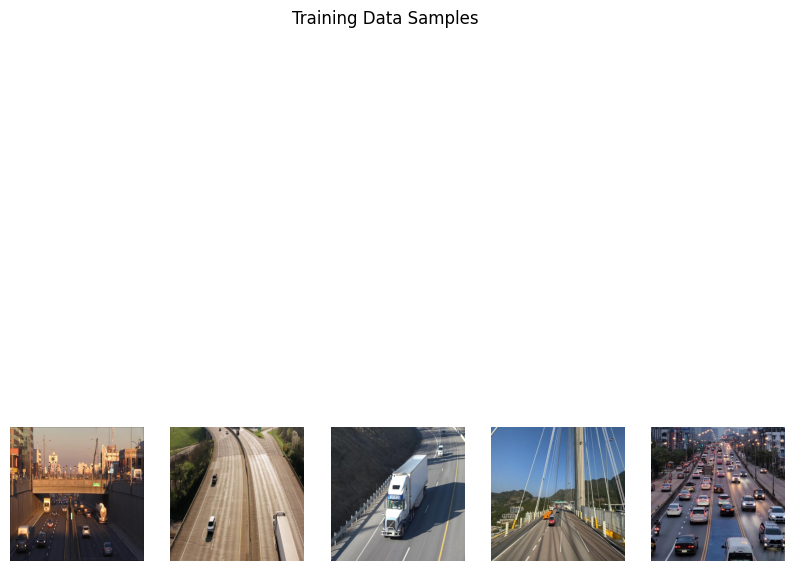

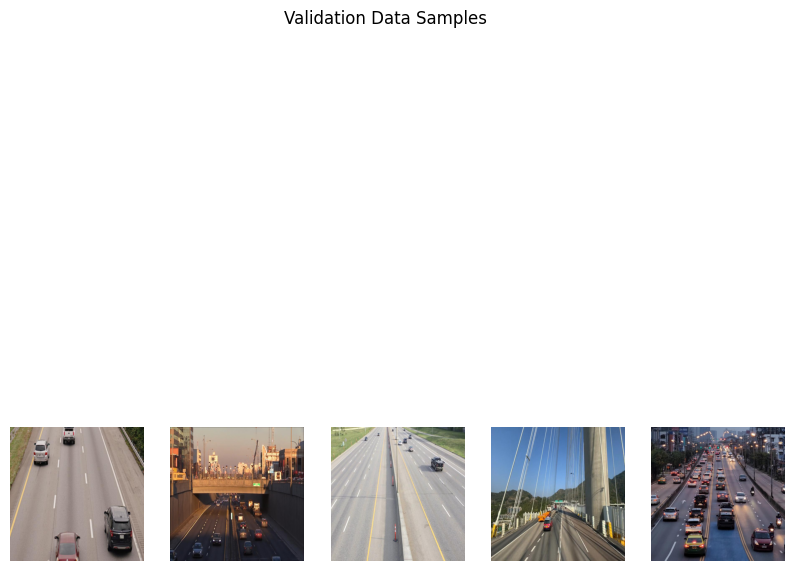

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

# Function to display images from the DataFrame
def display_sample_images(df, num_images=5, title="Sample Images"):
    plt.figure(figsize=(10, 10))

    for i in range(min(num_images, len(df))):
        img_path = df.iloc[i]['image_path']  # Get image path from DataFrame
        img = Image.open(img_path)  # Open the image using PIL

        # Display the image
        plt.subplot(1, num_images, i + 1)
        plt.imshow(img)
        plt.axis('off')  # Remove axis for better visualization
        #plt.title(f"Label: {df.iloc[i]['label']}")  # Show label as title

    plt.suptitle(title)
    plt.show()

# Display sample images from train and valid DataFrames
display_sample_images(train_df, num_images=5, title="Training Data Samples")
display_sample_images(valid_df, num_images=5, title="Validation Data Samples")


In [ ]:
# Make copies of the original train_df for each augmentation technique
train_df_for_datagen = train_df.copy()
train_df_for_gan = train_df.copy()

print("Shape of Data for image data generator:", train_df_for_datagen)
print("Shape of Data for GAN:", train_df_for_gan)


Shape of Data for image data generator:                                             image_path  label
0    ./data/train/test_mp4-6_jpg.rf.ab38a9d333977a3...  train
1    ./data/train/13_mp4-2_jpg.rf.91937da497cdf5495...  train
2    ./data/train/15_mp4-12_jpg.rf.1f65bc481957ccc0...  train
3    ./data/train/6_mp4-22_jpg.rf.f7ac0d15e2d881abc...  train
4    ./data/train/5_mp4-10_jpg.rf.654cb269de5223791...  train
..                                                 ...    ...
395  ./data/train/10_mp4-43_jpg.rf.ff8ca37b90dd5b5f...  train
396  ./data/train/8_mp4-11_jpg.rf.8fea274827ce0127a...  train
397  ./data/train/11_mp4-6_jpg.rf.0e2403b7629aac48f...  train
398  ./data/train/8_mp4-2_jpg.rf.8462155edecc784ea2...  train
399  ./data/train/5_mp4-11_jpg.rf.91ad9a7d8c9f22124...  train

[400 rows x 2 columns]
Shape of Data for GAN:                                             image_path  label
0    ./data/train/test_mp4-6_jpg.rf.ab38a9d333977a3...  train
1    ./data/train/13_mp4-2_jpg.rf.91937da497c

### Geometric Data Augmentation using Keras


Keras' `ImageDataGenerator` is a powerful utility that allows for real-time data augmentation of images, which is essential when working with limited datasets. Data augmentation helps improve model generalization by artificially increasing the size of the dataset using random transformations.

Some of the common transformations supported by `ImageDataGenerator` include:
- **Rotation**: Rotates images by a specified degree range.
- **Flipping**: Flips images horizontally and/or vertically.
- **Zooming**: Zooms into or out of images.
- **Shifting**: Shifts the height and width of the image by a specific fraction.

By applying these transformations, we ensure that the model learns to generalize well to unseen variations in the data.

In here, for each input image we generate 5 new samples based on the transformations.

For more details, see the [Image Data Generator](https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator)

### Steps:
1. **Initialize the `ImageDataGenerator`**: We define the transformations, such as rotation, shifts, and flips, and apply them randomly.
2. **Apply transformations**: For each input image, we generate 5 new augmented samples using random combinations of the transformations.
3. **Save augmented images**: These new samples are saved and added to our dataset, increasing its diversity.

Step 1: Define the geometric transformations in ImageDataGenerator

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

#Create ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rotation_range=30,  # Randomly rotate images in the range (0 to 30 degrees)
    width_shift_range=0.2,  # Randomly shift images horizontally (20% of total width)
    height_shift_range=0.2,  # Randomly shift images vertically (20% of total height)
    shear_range=0.2,  # Shear intensity (angle in counter-clockwise direction in degrees)
    zoom_range=0.2,  # Randomly zoom into images (20%)
    horizontal_flip=True,  # Randomly flip images horizontally
    fill_mode='nearest'  # Fill pixels outside the boundary with the nearest pixel value
)


Step 2: Apply Transformations

In [ ]:
# Function to augment images from the given DataFrame and save them locally
def augment_and_save_images(df, output_folder, num_samples=5):
    # Create the output directory if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Lists to store paths and labels of augmented images
    augmented_image_paths = []
    augmented_labels = []

    # Iterate over each image in the DataFrame
    for i in range(len(df)):
        img_path = df.iloc[i]['image_path']  # Get the image path
        label = df.iloc[i]['label']  # Get the corresponding label

        img = Image.open(img_path)  # Open the image using PIL
        img_array = np.expand_dims(np.array(img), axis=0)  # Convert to numpy array and expand dimensions

        # Create an iterator that will generate batches of augmented images
        aug_iter = datagen.flow(img_array, batch_size=1)

        # Generate and save augmented images
        for j in range(num_samples):  # Generate a specified number of augmented samples
            batch = next(aug_iter)  # Get the next batch of augmented images
            augmented_img = batch[0].astype(np.uint8)  # Convert back to uint8 format

            # Save augmented image locally
            augmented_img_pil = Image.fromarray(augmented_img)  # Convert back to PIL Image
            augmented_img_path = os.path.join(output_folder, f"aug_{i+1}_{j+1}.png")  # Define the new image path
            augmented_img_pil.save(augmented_img_path)  # Save the image

            # Add image path and corresponding label to the lists
            augmented_image_paths.append(augmented_img_path)
            augmented_labels.append(label)

    # Create a new DataFrame for augmented images
    augmented_df = pd.DataFrame({
        'image_path': augmented_image_paths,  # List of augmented image paths
        'label': augmented_labels  # Corresponding labels
    })

    return augmented_df  # Return the new DataFrame

In [ ]:
# Example usage:
output_folder = 'augmented_images/'  # Define the output folder for augmented images
idg_augmented_df = augment_and_save_images(train_df_for_datagen, output_folder, num_samples=5)  # Augment images and save


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  2000 non-null   object
 1   label       2000 non-null   object
dtypes: object(2)
memory usage: 31.4+ KB
Augmented Data info: None


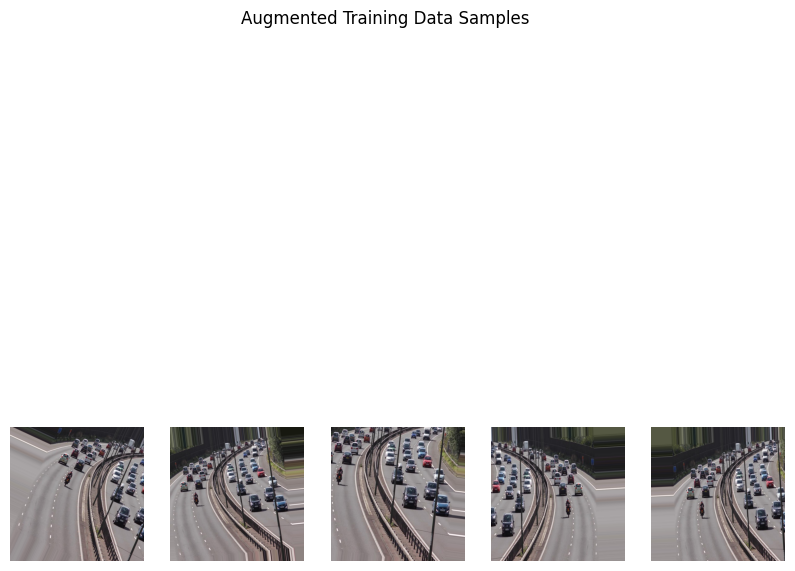

In [ ]:
print("Augmented Data info:", idg_augmented_df.info())
# Display some augmented images to verify
display_sample_images(idg_augmented_df, num_images=5, title="Augmented Training Data Samples")

Step 3: Save the augmented images to gcs bucket

In [ ]:
#To save te augmented images to the google storage bucket
import time
from google.cloud import storage
from google.api_core.exceptions import ServiceUnavailable

def upload_to_gcs(bucket_name, local_folder, gcs_folder, max_retries=5):
    storage_client = storage.Client()  # Create a Google Cloud Storage client
    bucket = storage_client.bucket(bucket_name)  # Get the bucket object

    uploaded_files = []  # List to keep track of uploaded file names

    # Walk through the local folder and upload files
    for root, _, files in os.walk(local_folder):  # Traverse the directory
        for file_name in files:  # Iterate through files
            local_file_path = os.path.join(root, file_name)  # Get the full local file path
            blob = bucket.blob(os.path.join(gcs_folder, file_name))  # Create a blob in GCS

            # Retry logic
            for attempt in range(max_retries):
                try:
                    blob.upload_from_filename(local_file_path)  # Upload the file to GCS
                    uploaded_files.append(file_name)  # Add the file name to the list
                    break  # Exit the retry loop if upload is successful
                except ServiceUnavailable:
                    if attempt < max_retries - 1:  # Don't wait after the last attempt
                        wait_time = 2 ** attempt  # Exponential backoff
                        print(f"Service unavailable. Retrying in {wait_time} seconds...")
                        time.sleep(wait_time)
                    else:
                        print(f"Failed to upload {file_name} after {max_retries} attempts.")

    # Print confirmation after uploading all files
    if uploaded_files:
        print(f"Successfully uploaded {len(uploaded_files)} files to {gcs_folder} in GCS: {', '.join(uploaded_files)}.")
    else:
        print("No files were uploaded.")

# Upload augmented images to GCS
gcs_augmented_folder = f"{dataset_name}/datagen_augmented_images/"  # Define the GCS folder for augmented images
upload_to_gcs(bucket_name, output_folder, gcs_augmented_folder)  # Upload the images


'\nimport time\nfrom google.cloud import storage\nfrom google.api_core.exceptions import ServiceUnavailable\n\ndef upload_to_gcs(bucket_name, local_folder, gcs_folder, max_retries=5):\n    storage_client = storage.Client()  # Create a Google Cloud Storage client\n    bucket = storage_client.bucket(bucket_name)  # Get the bucket object\n\n    uploaded_files = []  # List to keep track of uploaded file names\n\n    # Walk through the local folder and upload files\n    for root, _, files in os.walk(local_folder):  # Traverse the directory\n        for file_name in files:  # Iterate through files\n            local_file_path = os.path.join(root, file_name)  # Get the full local file path\n            blob = bucket.blob(os.path.join(gcs_folder, file_name))  # Create a blob in GCS\n\n            # Retry logic\n            for attempt in range(max_retries):\n                try:\n                    blob.upload_from_filename(local_file_path)  # Upload the file to GCS\n                    uploa

### Synthetic Image Generation with BigGAN

BigGAN is a large-scale generative adversarial network (GAN) developed by DeepMind, known for its ability to generate high-resolution, high-quality images. It is trained on a large dataset, like ImageNet, and allows conditional generation, meaning that you can specify a class label (e.g., "vehicle") and BigGAN will generate an image corresponding to that class.

### Why BigGAN?

In scenarios where certain vehicle classes (like buses, trucks, or scooters) are underrepresented in the dataset, **BigGAN** helps to balance the dataset by generating new samples. This additional data can improve the model's generalization, making it less likely to overfit to the original, limited dataset.

- **Class-Conditional Generation**: We specify the "vehicle" class to generate relevant synthetic images.
- **Filling Dataset Gaps**: BigGAN complements **geometric augmentation** by introducing entirely new images that wouldn’t exist otherwise, such as images of rarely seen vehicles (trucks, buses).
- **Diversity Control**: By adjusting noise vectors, we control the variety of generated images, helping us create more diverse training data.

In this notebook, for each input sample, we generate one new synthetic image using the pre-trained BigGAN model, which adds realistic diversity to the dataset.

For further reading, check out the [BigGAN](https://www.kaggle.com/models/deepmind/biggan)

### Steps:
1. **Load BigGAN**: We load the pre-trained BigGAN model, which is already trained on the ImageNet dataset, allowing us to generate images of specific classes.
2. **Set class vectors and noise**: BigGAN uses class vectors to define which type of image to generate (e.g., vehicle). Noise vectors are also added to introduce diversity.
3. **Generate synthetic images**: For each image in our dataset, we generate one new synthetic image that belongs to the vehicle class.
4. **Add to dataset**: These synthetic images are added to our dataset, enhancing the variety of vehicle images and filling gaps that may not be covered by geometric augmentation.




Step 1: Import necessary libraries

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

Step 2: Initialize the model path

In [ ]:
module_path = 'https://tfhub.dev/deepmind/biggan-deep-256/1'  # 256x256 BigGAN-deep
print(module_path)

https://tfhub.dev/deepmind/biggan-deep-256/1


Step 3: Load the model

In [ ]:
# Load pre-trained BigGAN model
module = hub.load(module_path)


Step 4: Set the class vectors and noise and Define fucntion to generate synthetic images

In [ ]:
def generate_biggan_images(z, class_vector, truncation):
    biggan = module.signatures['default']
    output = biggan(z=tf.convert_to_tensor(z, dtype=tf.float32),
                    y=tf.convert_to_tensor(class_vector, dtype=tf.float32),
                    truncation=tf.convert_to_tensor(truncation, dtype=tf.float32))
    output_images = output['default']  # Adjust this if needed
    return output_images

def rescale_images(output_images):
    output_images = (output_images.numpy() + 1) / 2.0  # Rescale to [0, 1]
    output_images = (output_images * 255).astype(np.uint8)  # Convert to [0, 255]
    return output_images

def generate_latent_vector(batch_size=1, dim=128):
    return np.random.normal(size=(batch_size, dim))

def create_class_vector(class_idx, batch_size=1, num_classes=1000):
    class_vector = np.zeros((batch_size, num_classes))
    class_vector[:, class_idx] = 1
    return class_vector

Step 5: Genrate synthetic images

In [ ]:
# Define a fixed set of vehicle labels and their corresponding ImageNet indices
label_to_imagenet_idx = {
    'cab': 468,
    'scooter': 670,
    'Bicycle':671,
    'Bus':[654,779,874],
    'Truck':[569,867]
  }


# Create a folder to store the generated images if it doesn't exist
output_folder = "gan_generated_images"
os.makedirs(output_folder, exist_ok=True)

# Save each generated image to the specified folder
def save_images_to_folder(images, output_folder, label):
    for idx, img in enumerate(images):
        # Create a unique filename for each image
        file_name = f"{label}_{idx}.png"
        file_path = os.path.join(output_folder, file_name)

        # Convert NumPy array to PIL image
        img_pil = Image.fromarray(img)

        # Save the image as a PNG file
        img_pil.save(file_path)
        print(f"Saved image: {file_path}")

In [ ]:
batch_size = 10  # Number of images to generate per label
truncation = 0.8  # Truncation for quality-diversity tradeoff

generated_images = []
for label, class_idx in label_to_imagenet_idx.items():
    print(f"Generating images for label: {label}")

    z = generate_latent_vector(batch_size=batch_size)
    class_vector = create_class_vector(class_idx, batch_size=batch_size)

    new_images = generate_biggan_images(z, class_vector, truncation)

    if new_images is not None:
        new_images_rescaled = rescale_images(new_images)
        generated_images.extend(new_images_rescaled)

        # Save the rescaled images to the folder
        save_images_to_folder(new_images_rescaled, output_folder, label)
    else:
        print(f"No images generated for label: {label}")

print(f"Total number of generated images: {len(generated_images)}")

Generating images for label: cab
Saved image: gan_generated_images/cab_0.png
Saved image: gan_generated_images/cab_1.png
Saved image: gan_generated_images/cab_2.png
Saved image: gan_generated_images/cab_3.png
Saved image: gan_generated_images/cab_4.png
Saved image: gan_generated_images/cab_5.png
Saved image: gan_generated_images/cab_6.png
Saved image: gan_generated_images/cab_7.png
Saved image: gan_generated_images/cab_8.png
Saved image: gan_generated_images/cab_9.png
Generating images for label: scooter
Saved image: gan_generated_images/scooter_0.png
Saved image: gan_generated_images/scooter_1.png
Saved image: gan_generated_images/scooter_2.png
Saved image: gan_generated_images/scooter_3.png
Saved image: gan_generated_images/scooter_4.png
Saved image: gan_generated_images/scooter_5.png
Saved image: gan_generated_images/scooter_6.png
Saved image: gan_generated_images/scooter_7.png
Saved image: gan_generated_images/scooter_8.png
Saved image: gan_generated_images/scooter_9.png
Generating

Step 6: Display the synthetic images

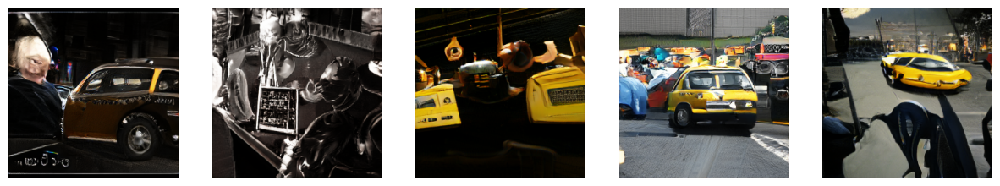

In [ ]:
def display_generated_images(images, num_images=5):
    num_images = min(num_images, len(images))  # Ensure num_images does not exceed available images
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))
    for i, img in enumerate(images[:num_images]):
        ax = axes[i]
        ax.imshow(img)
        ax.axis('off')
    plt.show()

display_generated_images(generated_images, num_images=5)

Step 7: Save the Synthetic images in the gcs bucket

In [ ]:
import time
from google.cloud import storage
from google.api_core.exceptions import ServiceUnavailable

def upload_to_gcs(bucket_name, local_folder, gcs_folder, max_retries=5):
    storage_client = storage.Client()  # Create a Google Cloud Storage client
    bucket = storage_client.bucket(bucket_name)  # Get the bucket object

    uploaded_files = []  # List to keep track of uploaded file names

    # Walk through the local folder and upload files
    for root, _, files in os.walk(local_folder):  # Traverse the directory
        for file_name in files:  # Iterate through files
            local_file_path = os.path.join(root, file_name)  # Get the full local file path
            blob = bucket.blob(os.path.join(gcs_folder, file_name))  # Create a blob in GCS

            # Retry logic
            for attempt in range(max_retries):
                try:
                    blob.upload_from_filename(local_file_path)  # Upload the file to GCS
                    uploaded_files.append(file_name)  # Add the file name to the list
                    break  # Exit the retry loop if upload is successful
                except ServiceUnavailable:
                    if attempt < max_retries - 1:  # Don't wait after the last attempt
                        wait_time = 2 ** attempt  # Exponential backoff
                        print(f"Service unavailable. Retrying in {wait_time} seconds...")
                        time.sleep(wait_time)
                    else:
                        print(f"Failed to upload {file_name} after {max_retries} attempts.")

    # Print confirmation after uploading all files
    if uploaded_files:
        print(f"Successfully uploaded {len(uploaded_files)} files to {gcs_folder} in GCS: {', '.join(uploaded_files)}.")
    else:
        print("No files were uploaded.")

# Upload augmented images to GCS
gcs_augmented_folder = f"{dataset_name}/biggan_generated_images/"  # Define the GCS folder for augmented images
upload_to_gcs(bucket_name, output_folder, gcs_augmented_folder)  # Upload the images


Successfully uploaded 50 files to Vehicle_Detection_Image_Dataset/biggan_generated_images/ in GCS: Bicycle_4.png, scooter_9.png, scooter_6.png, cab_5.png, Bus_1.png, Bus_4.png, cab_7.png, Bicycle_6.png, Bicycle_0.png, Bus_6.png, scooter_4.png, cab_6.png, Truck_5.png, Bus_0.png, scooter_3.png, scooter_5.png, Bus_8.png, cab_2.png, cab_0.png, cab_3.png, Bicycle_7.png, scooter_2.png, cab_9.png, Truck_7.png, Bicycle_1.png, Bus_5.png, scooter_0.png, cab_8.png, Truck_9.png, cab_1.png, Bus_7.png, Bicycle_5.png, Bus_3.png, Bicycle_9.png, Truck_1.png, Truck_8.png, Truck_0.png, Truck_3.png, Bicycle_8.png, Bus_2.png, cab_4.png, Bicycle_2.png, Bus_9.png, scooter_8.png, scooter_7.png, Bicycle_3.png, Truck_6.png, Truck_4.png, scooter_1.png, Truck_2.png.


This section leverages BigGAN to generate synthetic images. By providing a latent vector and a class vector corresponding to different vehicle types, we generate new images for classes like trucks, buses, and bicycles. These images are saved and stored for further use.

### Image Generation using Stable Diffusion


Stable Diffusion is a cutting-edge text-to-image model designed to generate high-quality images based on textual prompts. Unlike GANs, which require class labels, Stable Diffusion allows users to describe what they want to see (e.g., "a top-view image of a vehicle on the road"), and the model will generate images that match the description. This model is part of the `diffusers` library by Hugging Face and has quickly become one of the most popular tools in the field of generative AI.


### Why Stable Diffusion?

Using Stable Diffusion, we can describe specific scenarios, such as:
- **"Top-view of a vehicle on a rainy night"** or
- **"A red truck in a parking lot"**

This gives us the flexibility to create **contextual, scenario-based data**, which is crucial when training models for specific conditions that may not be well-represented in the original dataset.

- **Customizable Image Generation**: By modifying the text prompt, we can tailor the images to simulate real-world scenarios that might be missing from the original dataset.
- **Context-Specific Data**: This approach enables us to enrich the dataset with images based on specific weather, lighting, or vehicle conditions (e.g., generating images with different weather conditions or road types).
- **Prompts as a Control Mechanism**: The flexibility in prompt design allows us to fine-tune the images generated, ensuring that they match specific needs, like vehicle color, position, or background.

In this notebook, we use Stable Diffusion to generate one new image for each input sample based on custom prompts. This enhances our dataset with images that better reflect the complexities of real-world conditions.

Learn more in the [Stable Diffusion Model](https://huggingface.co/docs/diffusers/en/api/pipelines/stable_diffusion/text2img)

### Steps:
1. **Load Stable Diffusion model**: We use the pre-trained Stable Diffusion model available via Hugging Face’s `diffusers` library.
2. **Define prompts**: For each input, we create a textual prompt that describes the desired image. For example, "a top-view image of a vehicle on a highway."
3. **Generate images**: The model generates images based on the textual descriptions, producing high-quality outputs that match the description.
4. **Augment the dataset**: These newly generated images, which are descriptive and diverse, are added to our dataset to further enhance it.


Step 1: Import Necessary Libraries

In [ ]:
import os
import random
import pandas as pd
from diffusers import StableDiffusionPipeline
import torch
from PIL import Image
import matplotlib.pyplot as plt
import concurrent.futures
import time
from google.cloud import storage
from google.api_core.exceptions import ServiceUnavailable

Step 2: Load a Stable Diffusion model from Hugging Face

In [ ]:
# Load a Stable Diffusion model from Hugging Face
model_id = "CompVis/stable-diffusion-v1-4"
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe = pipe.to("cuda")  # Use GPU for faster computation
pipe.safety_checker = None  # Disable safety checker here


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


Step 3: Generate diverse prompts

Example Prompts:
- "Cars on a highway during sunny morning."
- "Trucks on a highway during foggy evening."
- "Bicycles on a highway during rainy afternoon."
- "Motorcycles on a highway during snowy night."

In [ ]:
# Step 2: Create diverse prompts
weather_conditions = ["sunny", "rainy", "foggy", "snowy"]
times_of_day = ["morning", "afternoon", "evening", "night"]
vehicle_types = ["cars", "trucks", "bicycles", "motorcycles"]

# Generate diverse prompts
diverse_prompts = []
for weather in weather_conditions:
    for time in times_of_day:
        for vehicle in vehicle_types:
            diverse_prompts.append(f"{vehicle} on a highway during a {weather} {time}")


# Define output folder (local directory)
output_folder = "./generated_images"  # Relative path for local directory
os.makedirs(output_folder, exist_ok=True)  # Create output folder if it doesn't exist


Step 4: Generate synthetic images and save them in the gcs bucket

In [ ]:
# Step 4: Generate synthetic images and save them in the gcs bucket
image_data = []  # List to store image data for DataFrame
gcs_bucket_name = "bucket name"  # Replace with your GCS bucket name
folder_name = f"{dataset_name}/generated_images/"  # Define the GCS folder for generated images

# Initialize Google Cloud Storage client
client = storage.Client()

for prompt in diverse_prompts:
    for i in range(2):  # Generate 2 images for each prompt
        modified_prompt = f"{prompt} - Variation {random.randint(1, 50)}"
        image = pipe(modified_prompt).images[0]

        # Save the generated image locally
        image_name = f"{prompt.replace(' ', '_')}_{i + 1}.png"
        image_path = os.path.join(output_folder, image_name)
        image.save(image_path)
        print(f"Saved: {image_path}")

        # Upload the image to GCS in the specified folder
        blob = client.bucket(gcs_bucket_name).blob(f"{folder_name}{image_name}")  # Create a blob with folder path
        blob.upload_from_filename(image_path)  # Upload the image
        print(f"Uploaded to GCS: {folder_name}{image_name}")

        # Append image path and label to the list
        image_data.append({"image_path": image_path, "label": prompt})



  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_sunny_morning_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_sunny_morning_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_sunny_morning_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_sunny_morning_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_sunny_morning_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_sunny_morning_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_sunny_morning_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_sunny_morning_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_sunny_morning_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_sunny_morning_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_sunny_morning_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_sunny_morning_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_sunny_morning_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_sunny_morning_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_sunny_morning_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_sunny_morning_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_sunny_afternoon_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_sunny_afternoon_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_sunny_afternoon_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_sunny_afternoon_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_sunny_afternoon_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_sunny_afternoon_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_sunny_afternoon_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_sunny_afternoon_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_sunny_afternoon_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_sunny_afternoon_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_sunny_afternoon_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_sunny_afternoon_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_sunny_afternoon_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_sunny_afternoon_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_sunny_afternoon_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_sunny_afternoon_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_sunny_evening_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_sunny_evening_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_sunny_evening_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_sunny_evening_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_sunny_evening_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_sunny_evening_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_sunny_evening_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_sunny_evening_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_sunny_evening_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_sunny_evening_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_sunny_evening_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_sunny_evening_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_sunny_evening_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_sunny_evening_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_sunny_evening_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_sunny_evening_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_sunny_night_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_sunny_night_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_sunny_night_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_sunny_night_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_sunny_night_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_sunny_night_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_sunny_night_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_sunny_night_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_sunny_night_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_sunny_night_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_sunny_night_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_sunny_night_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_sunny_night_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_sunny_night_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_sunny_night_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_sunny_night_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_rainy_morning_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_rainy_morning_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_rainy_morning_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_rainy_morning_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_rainy_morning_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_rainy_morning_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_rainy_morning_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_rainy_morning_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_rainy_morning_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_rainy_morning_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_rainy_morning_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_rainy_morning_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_rainy_morning_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_rainy_morning_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_rainy_morning_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_rainy_morning_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_rainy_afternoon_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_rainy_afternoon_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_rainy_afternoon_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_rainy_afternoon_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_rainy_afternoon_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_rainy_afternoon_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_rainy_afternoon_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_rainy_afternoon_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_rainy_afternoon_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_rainy_afternoon_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_rainy_afternoon_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_rainy_afternoon_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_rainy_afternoon_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_rainy_afternoon_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_rainy_afternoon_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_rainy_afternoon_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_rainy_evening_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_rainy_evening_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_rainy_evening_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_rainy_evening_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_rainy_evening_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_rainy_evening_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_rainy_evening_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_rainy_evening_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_rainy_evening_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_rainy_evening_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_rainy_evening_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_rainy_evening_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_rainy_evening_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_rainy_evening_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_rainy_evening_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_rainy_evening_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_rainy_night_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_rainy_night_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_rainy_night_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_rainy_night_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_rainy_night_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_rainy_night_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_rainy_night_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_rainy_night_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_rainy_night_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_rainy_night_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_rainy_night_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_rainy_night_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_rainy_night_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_rainy_night_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_rainy_night_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_rainy_night_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_foggy_morning_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_foggy_morning_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_foggy_morning_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_foggy_morning_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_foggy_morning_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_foggy_morning_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_foggy_morning_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_foggy_morning_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_foggy_morning_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_foggy_morning_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_foggy_morning_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_foggy_morning_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_foggy_morning_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_foggy_morning_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_foggy_morning_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_foggy_morning_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_foggy_afternoon_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_foggy_afternoon_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_foggy_afternoon_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_foggy_afternoon_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_foggy_afternoon_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_foggy_afternoon_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_foggy_afternoon_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_foggy_afternoon_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_foggy_afternoon_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_foggy_afternoon_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_foggy_afternoon_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_foggy_afternoon_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_foggy_afternoon_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_foggy_afternoon_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_foggy_afternoon_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_foggy_afternoon_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_foggy_evening_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_foggy_evening_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_foggy_evening_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_foggy_evening_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_foggy_evening_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_foggy_evening_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_foggy_evening_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_foggy_evening_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_foggy_evening_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_foggy_evening_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_foggy_evening_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_foggy_evening_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_foggy_evening_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_foggy_evening_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_foggy_evening_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_foggy_evening_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_foggy_night_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_foggy_night_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_foggy_night_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_foggy_night_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_foggy_night_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_foggy_night_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_foggy_night_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_foggy_night_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_foggy_night_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_foggy_night_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_foggy_night_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_foggy_night_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_foggy_night_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_foggy_night_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_foggy_night_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_foggy_night_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_snowy_morning_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_snowy_morning_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_snowy_morning_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_snowy_morning_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_snowy_morning_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_snowy_morning_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_snowy_morning_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_snowy_morning_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_snowy_morning_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_snowy_morning_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_snowy_morning_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_snowy_morning_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_snowy_morning_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_snowy_morning_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_snowy_morning_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_snowy_morning_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_snowy_afternoon_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_snowy_afternoon_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_snowy_afternoon_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_snowy_afternoon_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_snowy_afternoon_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_snowy_afternoon_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_snowy_afternoon_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_snowy_afternoon_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_snowy_afternoon_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_snowy_afternoon_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_snowy_afternoon_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_snowy_afternoon_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_snowy_afternoon_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_snowy_afternoon_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_snowy_afternoon_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_snowy_afternoon_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_snowy_evening_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_snowy_evening_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_snowy_evening_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_snowy_evening_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_snowy_evening_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_snowy_evening_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_snowy_evening_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_snowy_evening_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_snowy_evening_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_snowy_evening_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_snowy_evening_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_snowy_evening_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_snowy_evening_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_snowy_evening_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_snowy_evening_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_snowy_evening_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_snowy_night_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_snowy_night_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/cars_on_a_highway_during_a_snowy_night_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/cars_on_a_highway_during_a_snowy_night_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_snowy_night_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_snowy_night_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/trucks_on_a_highway_during_a_snowy_night_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/trucks_on_a_highway_during_a_snowy_night_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_snowy_night_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_snowy_night_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/bicycles_on_a_highway_during_a_snowy_night_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/bicycles_on_a_highway_during_a_snowy_night_2.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_snowy_night_1.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_snowy_night_1.png


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: ./generated_images/motorcycles_on_a_highway_during_a_snowy_night_2.png
Uploaded to GCS: Vehicle_Detection_Image_Dataset/generated_images/motorcycles_on_a_highway_during_a_snowy_night_2.png


Step 5: Create a DataFrame of generated images

In [ ]:
# Step 5: Create a DataFrame
generated_images_df = pd.DataFrame(image_data)
generated_images_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128 entries, 0 to 127
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  128 non-null    object
 1   label       128 non-null    object
dtypes: object(2)
memory usage: 2.1+ KB


### Step 6: Display the first few genertaed images

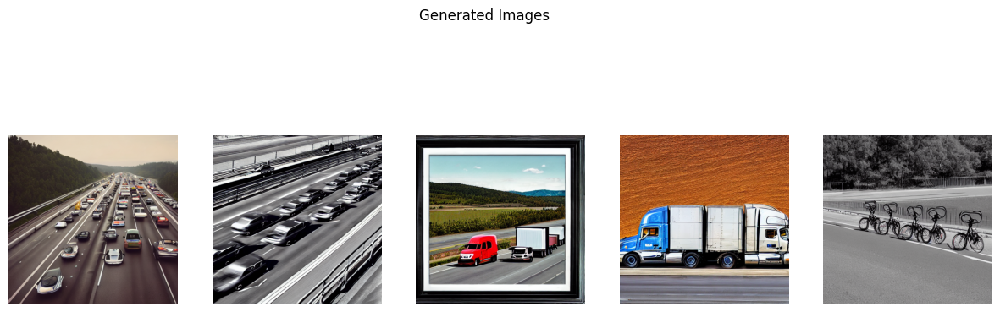

In [ ]:
# Step 6: Display the first few images
def display_images(df, title="Sample Title"):
    plt.figure(figsize=(15, 15))
    for i, row in df.iterrows():
        img = Image.open(row['image_path'])
        plt.subplot(5, 5, i + 1)  # Adjust number of rows and columns as needed
        plt.imshow(img)
        plt.axis('off')

    plt.suptitle(title)
    plt.show()

# Display the first 5 images
display_images(generated_images_df.head(5), title="Generated Images")

### Vehicle Object Detection Using Yolov8




YOLO (You Only Look Once) is a popular object detection model known for its speed and accuracy. YOLOv8 is the latest version, which brings improvements in terms of model architecture and training efficiency. It is designed to detect objects in images with high speed and precision, making it suitable for real-time applications such as vehicle detection in traffic.

Key improvements in YOLOv8 include:
- **Better accuracy**: YOLOv8 has higher detection accuracy compared to earlier versions.
- **Fast inference**: Despite its accuracy, YOLOv8 maintains YOLO’s signature high-speed inference, which is essential for real-time applications.
- **Simplified architecture**: YOLOv8's new architecture is more efficient and easier to train, with flexible configuration options for deployment in various environments.

Using YOLOv8 in this project helps in accurately detecting vehicles in the augmented images, providing a robust solution for vehicle detection tasks.

For more information, visit the
[YOLOv8](https://huggingface.co/Ultralytics/YOLOv8)

### Steps:
1. **Load YOLOv8 model**: We load the pre-trained YOLOv8 model, which is used as annotation tool to annotate the dataset and inferenced for detecting various objects, including vehicles.
2. **Input augmented images**: The augmented dataset (which includes the original images, geometric transformations, BigGAN, and Stable Diffusion images) is passed through the YOLOv8 model for inference.
3. **Perform detection**: YOLOv8 detects vehicles in the input images and generates bounding boxes and confidence scores.
4. **Evaluate performance**: After detection, we evaluate how well YOLOv8 performs on the augmented dataset compared to the original dataset. This helps assess the effectiveness of the augmentations.







In [ ]:
import gcsfs
fs = gcsfs.GCSFileSystem(project='project_id') #Replace it with your project id

Step 1: Load the pre-trained Yolov8 model

In [ ]:
from ultralytics import YOLO

# Load a pre-trained YOLOv8 model (you can choose a different version, like yolov8m.pt or yolov8l.pt)
model = YOLO('yolov8s.pt')


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 21.5M/21.5M [00:00<00:00, 470MB/s]


Step 2: Annotate the augmented and generated images using pre-trained model

In [ ]:
import gcsfs
from ultralytics import YOLO
from PIL import Image
import io
import numpy as np

# GCS Bucket and directories
bucket_name = 'bucket name' #Replace it with your bucket name
image_dirs = [
    'Vehicle_Detection_Image_Dataset/datagen_augmented_images',
    'Vehicle_Detection_Image_Dataset/generated_images',
    'Vehicle_Detection_Image_Dataset/biggan_generated_images'
]

# Loop through the directories and run inference on each image
for folder in image_dirs:
    image_files = fs.ls(f'{bucket_name}/{folder}')  # List files in GCS folder

    # Filter to only include .jpg and .png images
    image_files = [f for f in image_files if f.endswith(('.jpg', '.png'))]

    for image_file in image_files:
        # Open image file from GCS
        with fs.open(f'gs://{image_file}', 'rb') as f:
            img_data = f.read()  # Read image file

        # Convert byte data to a PIL Image
        pil_image = Image.open(io.BytesIO(img_data))

        # Convert PIL Image to NumPy array (this is the format YOLOv8 expects)
        np_image = np.array(pil_image)

        # Run YOLOv8 inference
        results = model(np_image)

        # Save the YOLO format labels in the corresponding GCS directory
        label_file = image_file.replace('.jpg', '.txt').replace('.png', '.txt')
        label_content = ""

        # Iterate over the bounding boxes and class IDs from the results
        for i, box in enumerate(results[0].boxes.xywh):  # YOLO format (x_center, y_center, width, height)
            class_id = int(results[0].boxes.cls[i].item())  # Get the class ID
            x_center, y_center, width, height = box  # Bounding box values

            # YOLO format: class_id, x_center, y_center, width, height (normalized)
            label_content += f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}\n"

        # Write labels back to GCS as a .txt file
        with fs.open(f'gs://{label_file}', 'w') as f:
            f.write(label_content)

Streaming output truncated to the last 5000 lines.
0: 640x640 4 cars, 16.6ms
Speed: 2.2ms preprocess, 16.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 cars, 16.5ms
Speed: 2.5ms preprocess, 16.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 5 cars, 16.5ms
Speed: 1.7ms preprocess, 16.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 4 cars, 1 truck, 16.5ms
Speed: 2.4ms preprocess, 16.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 traffic lights, 16.5ms
Speed: 2.3ms preprocess, 16.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 traffic light, 1 dog, 16.6ms
Speed: 2.1ms preprocess, 16.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 16.5ms
Speed: 1.7ms preprocess, 16.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 cars, 2 traffic lights, 

Step 3: Combine the Augmented data with Train data to make combined_datset

In [ ]:
import os
import gcsfs

# Initialize Google Cloud Storage filesystem
fs = gcsfs.GCSFileSystem(project='project id')

# Define the paths for the source and destination datasets
bucket_name = 'bucket name'
dataset_folders = [
    'Vehicle_Detection_Image_Dataset/train',
    'Vehicle_Detection_Image_Dataset/datagen_augmented_images',
    'Vehicle_Detection_Image_Dataset/generated_images',
    'Vehicle_Detection_Image_Dataset/biggan_generated_images'
]

# Combined dataset structure in GCS
combined_image_dir_gcs = 'Vehicle_Detection_Image_Dataset/combined_dataset/images/train'
combined_label_dir_gcs = 'Vehicle_Detection_Image_Dataset/combined_dataset/labels/train'

# Ensure combined directories exist in GCS
fs.mkdirs(f'{bucket_name}/{combined_image_dir_gcs}', exist_ok=True)
fs.mkdirs(f'{bucket_name}/{combined_label_dir_gcs}', exist_ok=True)

# Combined dataset structure locally
local_combined_image_dir = 'combined_dataset/images/train'
local_combined_label_dir = 'combined_dataset/labels/train'

# Ensure combined directories exist locally
os.makedirs(local_combined_image_dir, exist_ok=True)
os.makedirs(local_combined_label_dir, exist_ok=True)

# Loop through each folder in GCS and copy images and labels to the combined dataset in GCS
for folder in dataset_folders:
    # List all files in the source folder in GCS
    image_files = fs.ls(f'{bucket_name}/{folder}')

    # Check if this folder has already been combined
    all_files_combined = True  # Flag to check if all files are already combined

    for image_file in image_files:
        if image_file.endswith(('.jpg', '.png')):
            # Image file destination in GCS
            image_dest_gcs = os.path.join(combined_image_dir_gcs, os.path.basename(image_file))

            # Skip this file if it already exists in the combined dataset
            if fs.exists(f'gs://{bucket_name}/{image_dest_gcs}'):
                continue  # Skip the file if it already exists
            else:
                all_files_combined = False  # Set flag to False, since a file is not yet combined

            # Copy image to the combined dataset in GCS
            with fs.open(f'gs://{image_file}', 'rb') as f:
                img_data = f.read()
            with fs.open(f'gs://{bucket_name}/{image_dest_gcs}', 'wb') as f:
                f.write(img_data)

            # Label file corresponding to the image
            label_file = image_file.replace('.jpg', '.txt').replace('.png', '.txt')
            label_dest_gcs = os.path.join(combined_label_dir_gcs, os.path.basename(label_file))

            # Copy label to GCS if it exists
            if fs.exists(f'gs://{label_file}'):
                if not fs.exists(f'gs://{bucket_name}/{label_dest_gcs}'):  # Skip if label already combined
                    with fs.open(f'gs://{label_file}', 'rb') as f:
                        label_data = f.read()
                    with fs.open(f'gs://{bucket_name}/{label_dest_gcs}', 'wb') as f:
                        f.write(label_data)

    # If all files were already combined, skip this folder
    if all_files_combined:
        print(f"Folder '{folder}' already combined. Skipping...")
    else:
        print(f"Processed folder '{folder}'.")

# Now, copy the combined dataset from GCS to local storage
combined_image_files_gcs = fs.ls(f'{bucket_name}/{combined_image_dir_gcs}')
combined_label_files_gcs = fs.ls(f'{bucket_name}/{combined_label_dir_gcs}')

# Download images from GCS to local directory
for image_file_gcs in combined_image_files_gcs:
    local_image_path = os.path.join(local_combined_image_dir, os.path.basename(image_file_gcs))

    # Skip if already exists locally
    if not os.path.exists(local_image_path):
        fs.get(f'gs://{image_file_gcs}', local_image_path)

# Download labels from GCS to local directory
for label_file_gcs in combined_label_files_gcs:
    local_label_path = os.path.join(local_combined_label_dir, os.path.basename(label_file_gcs))

    # Skip if already exists locally
    if not os.path.exists(local_label_path):
        fs.get(f'gs://{label_file_gcs}', local_label_path)

print("Combined dataset successfully copied locally.")


Folder 'Vehicle_Detection_Image_Dataset/train' already combined. Skipping...
Folder 'Vehicle_Detection_Image_Dataset/datagen_augmented_images' already combined. Skipping...
Folder 'Vehicle_Detection_Image_Dataset/generated_images' already combined. Skipping...
Folder 'Vehicle_Detection_Image_Dataset/biggan_generated_images' already combined. Skipping...
Combined dataset successfully copied locally.


Step 4: Use combined dataset for Vehicle Object Detection using Yolov8 model.


image 1/1 /content/combined_dataset/images/train/aug_391_1.png: 640x640 2 persons, 29 cars, 2 trucks, 16.4ms
Speed: 1.7ms preprocess, 16.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


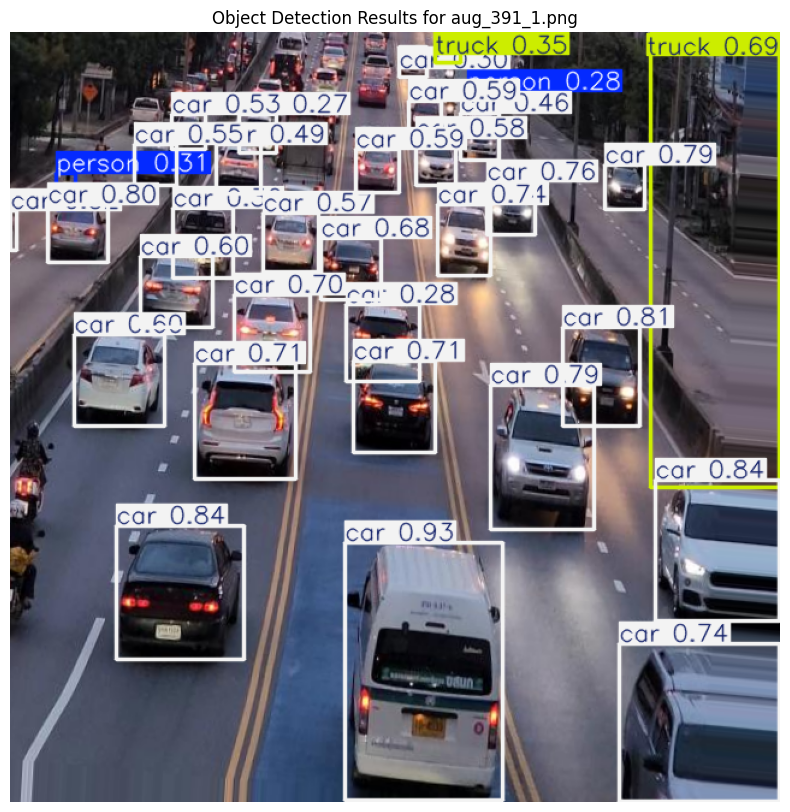


image 1/1 /content/combined_dataset/images/train/aug_167_2.png: 640x640 1 truck, 16.6ms
Speed: 2.4ms preprocess, 16.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


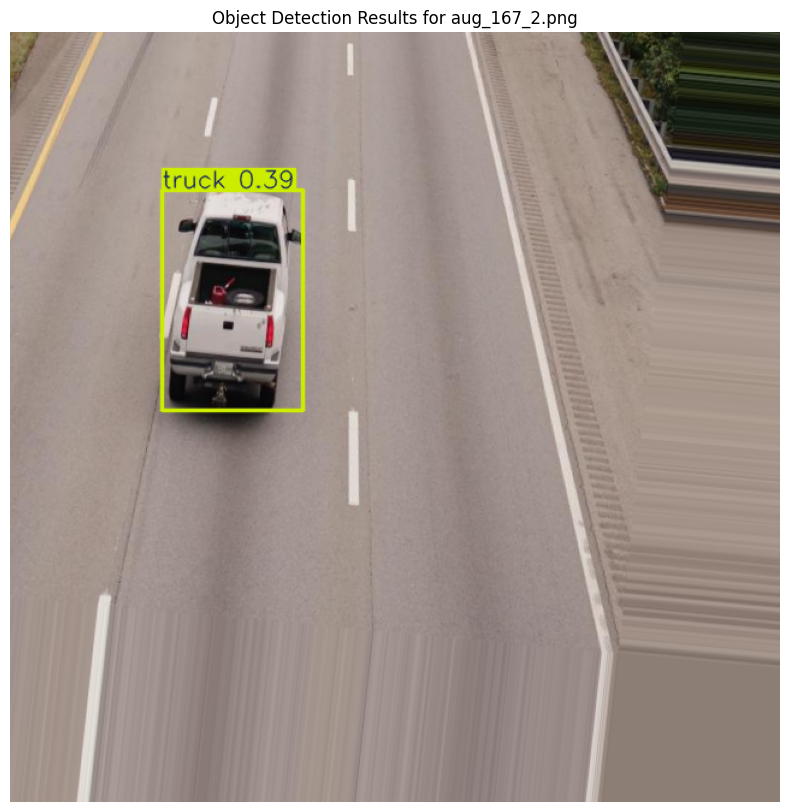


image 1/1 /content/combined_dataset/images/train/aug_99_4.png: 640x640 18 cars, 1 truck, 16.5ms
Speed: 2.0ms preprocess, 16.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


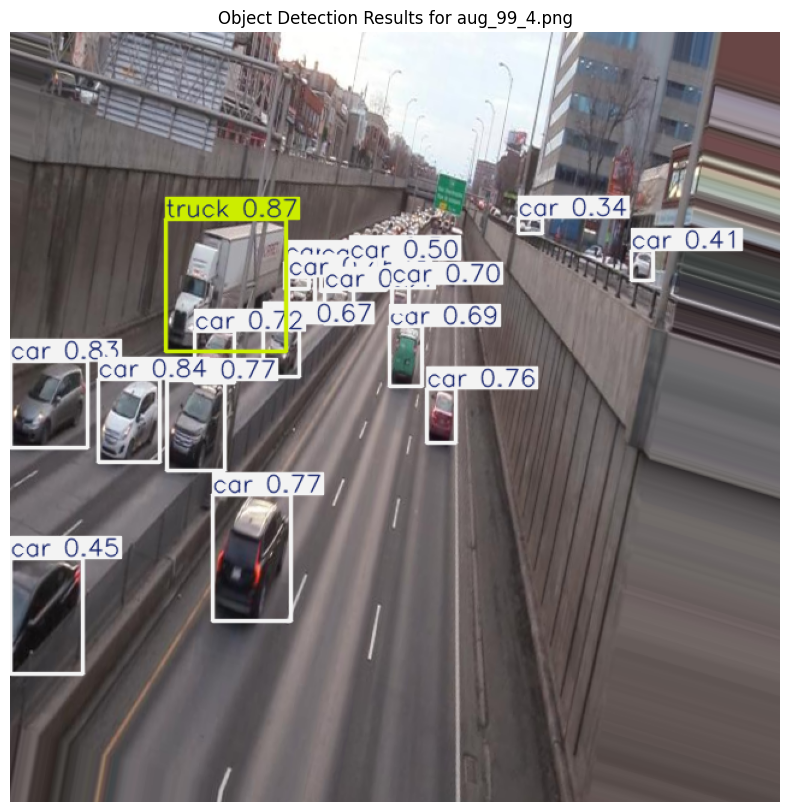


image 1/1 /content/combined_dataset/images/train/aug_134_4.png: 640x640 (no detections), 16.5ms
Speed: 1.6ms preprocess, 16.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


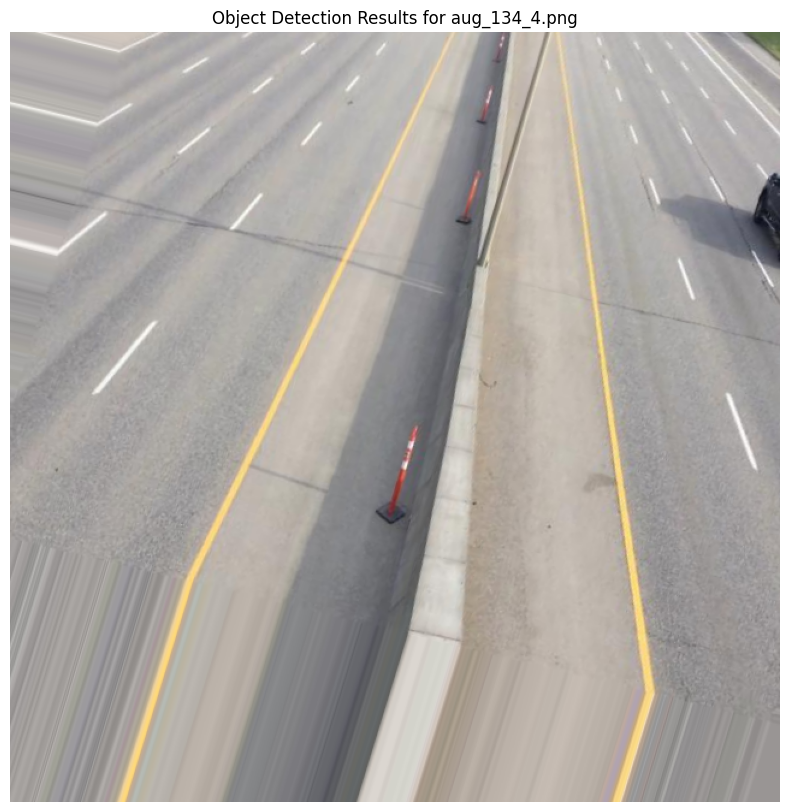


image 1/1 /content/combined_dataset/images/train/aug_150_4.png: 640x640 14 cars, 16.5ms
Speed: 1.7ms preprocess, 16.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


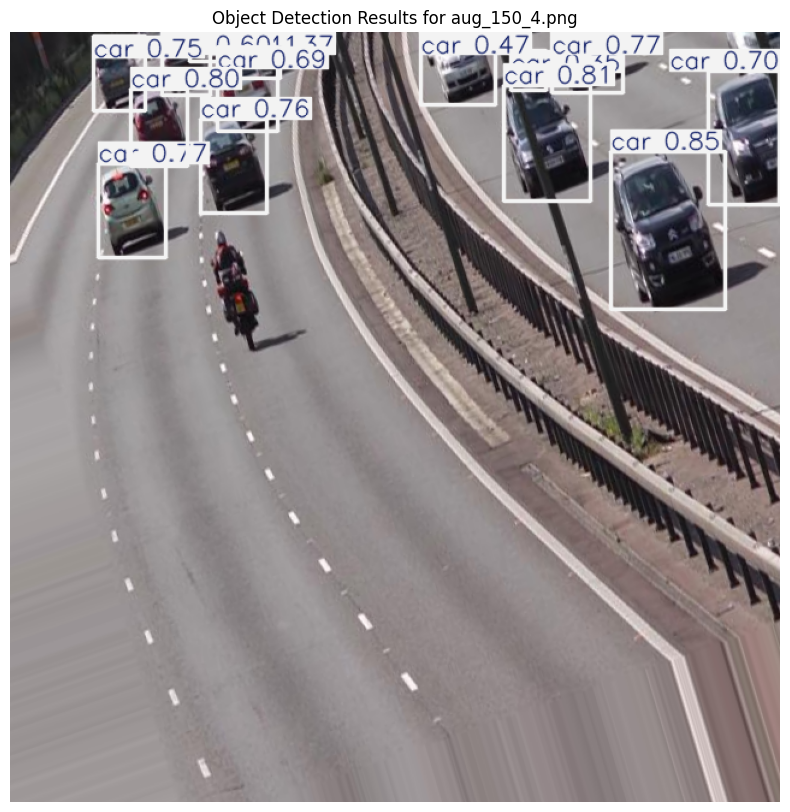

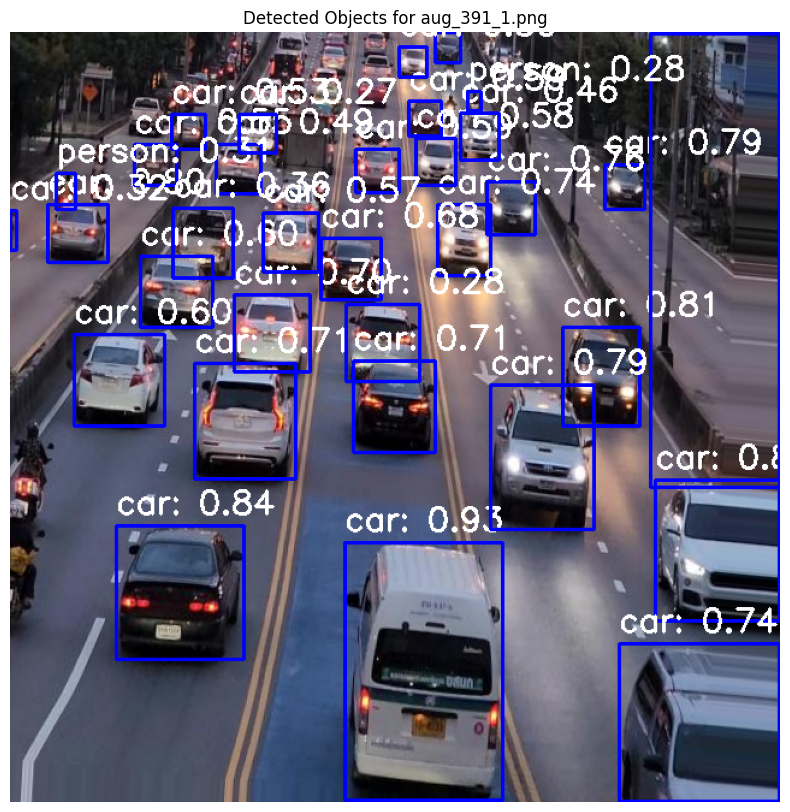

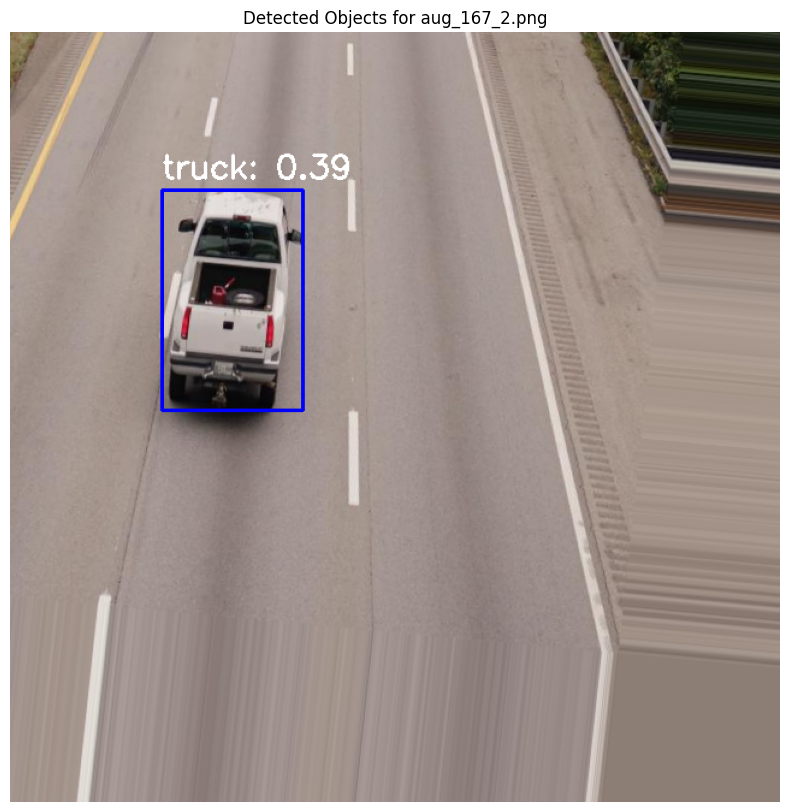

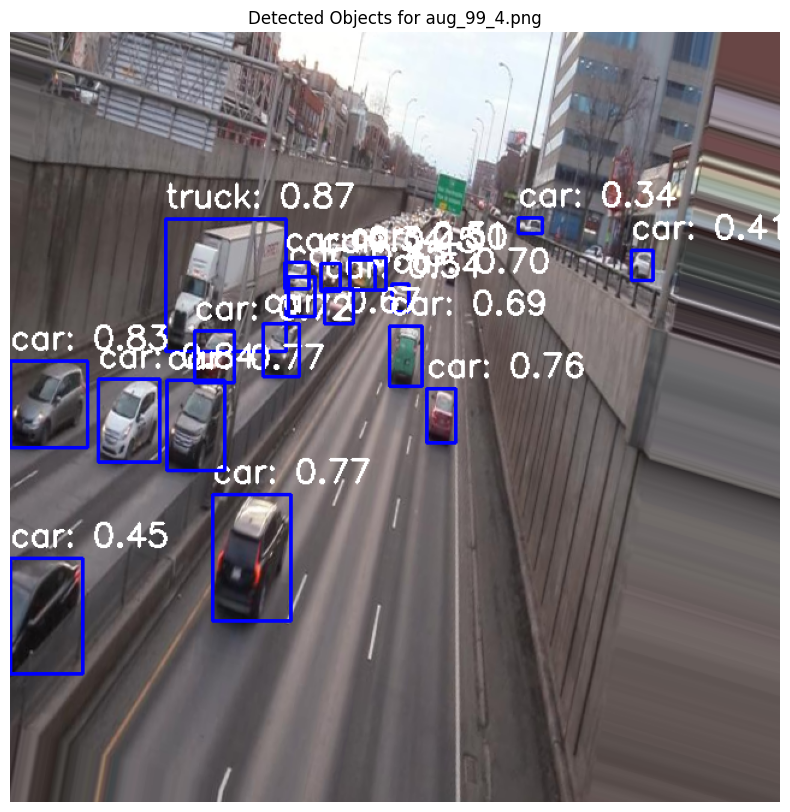

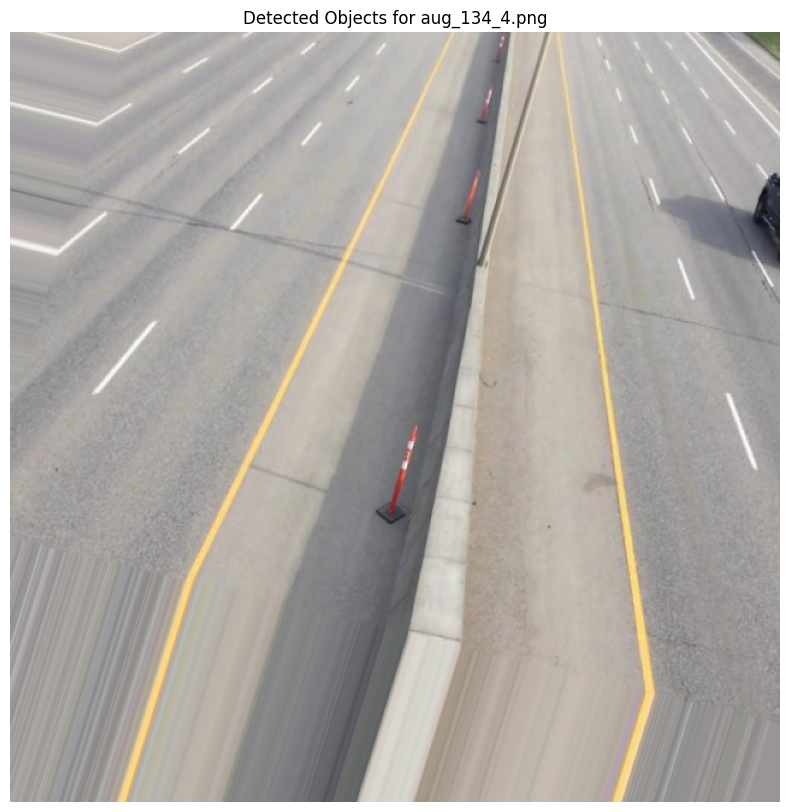

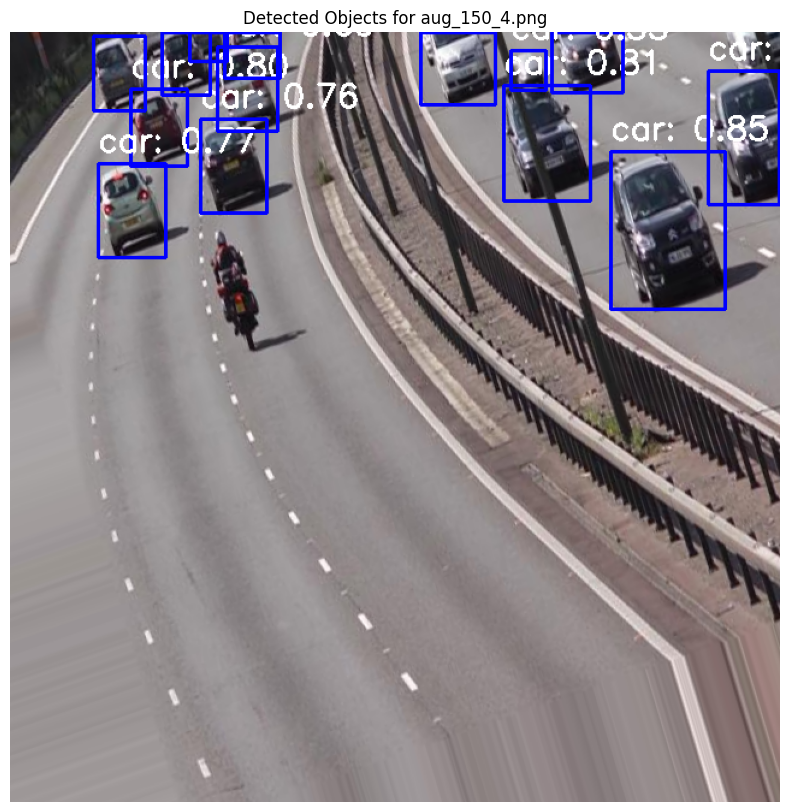

In [ ]:
import torch
from ultralytics import YOLO
import cv2
import os
import matplotlib.pyplot as plt

# Load a pre-trained YOLOv8 model (you can choose a different version, like yolov8m.pt or yolov8l.pt)
model = YOLO('yolov8s.pt')

# Path to your combined dataset (local path with images for inference)
image_folder = 'combined_dataset/images/train'

# List a few sample images for inference and visualization (limiting to 5 images)
sample_images = [os.path.join(image_folder, img) for img in os.listdir(image_folder) if img.endswith(('.jpg', '.png'))][:5]

# Run inference on each sample image and store results
results_list = []
for image_path in sample_images:
    results = model(image_path)  # Perform inference on the image
    results_list.append(results)

    # Display the results with bounding boxes and labels
    img = cv2.imread(image_path)
    result_img = results[0].plot()  # Draws bounding boxes and labels on the image
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title(f"Object Detection Results for {os.path.basename(image_path)}")
    plt.show()

# Function to visualize bounding boxes and labels on images
def visualize_detection(image_path, results):
    img = cv2.imread(image_path)
    boxes = results[0].boxes.xyxy.cpu().numpy()  # Bounding boxes in xyxy format
    class_ids = results[0].boxes.cls.cpu().numpy()  # Class IDs
    confidences = results[0].boxes.conf.cpu().numpy()  # Confidence scores

    for box, cls, conf in zip(boxes, class_ids, confidences):
        x1, y1, x2, y2 = map(int, box)
        label = f'{model.names[int(cls)]}: {conf:.2f}'
        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)  # Draw bounding box
        cv2.putText(img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 255, 255), 2)  # Label

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title(f"Detected Objects for {os.path.basename(image_path)}")
    plt.show()

# Run visualization on sample images with bounding boxes and labels
for i, image_path in enumerate(sample_images):
    visualize_detection(image_path, results_list[i])


### Conclusion

In this notebook, we applied three different augmentation techniques—geometric transformations, BigGAN synthetic image generation, and Stable Diffusion prompt-based image generation—to a vehicle detection dataset. These augmented images were used with a pre-trained YOLOv8 model to enhance vehicle detection performance.

The combination of traditional augmentation and Generative AI provides a powerful approach to diversify training datasets, potentially improving model robustness and accuracy.